### **Изображение типичного инопланетянина**

In [ ]:
!pip install diffusers --upgrade
!pip install invisible_watermark transformers accelerate safetensors

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 60.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 37.1 MB/s eta 0:00:00


In [ ]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

# if using torch < 2.0
# pipe.enable_xformers_memory_efficient_attention()

In [ ]:
prompt = "Alien with eyes on arms sitting in a hotel"

images = pipe(prompt=prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

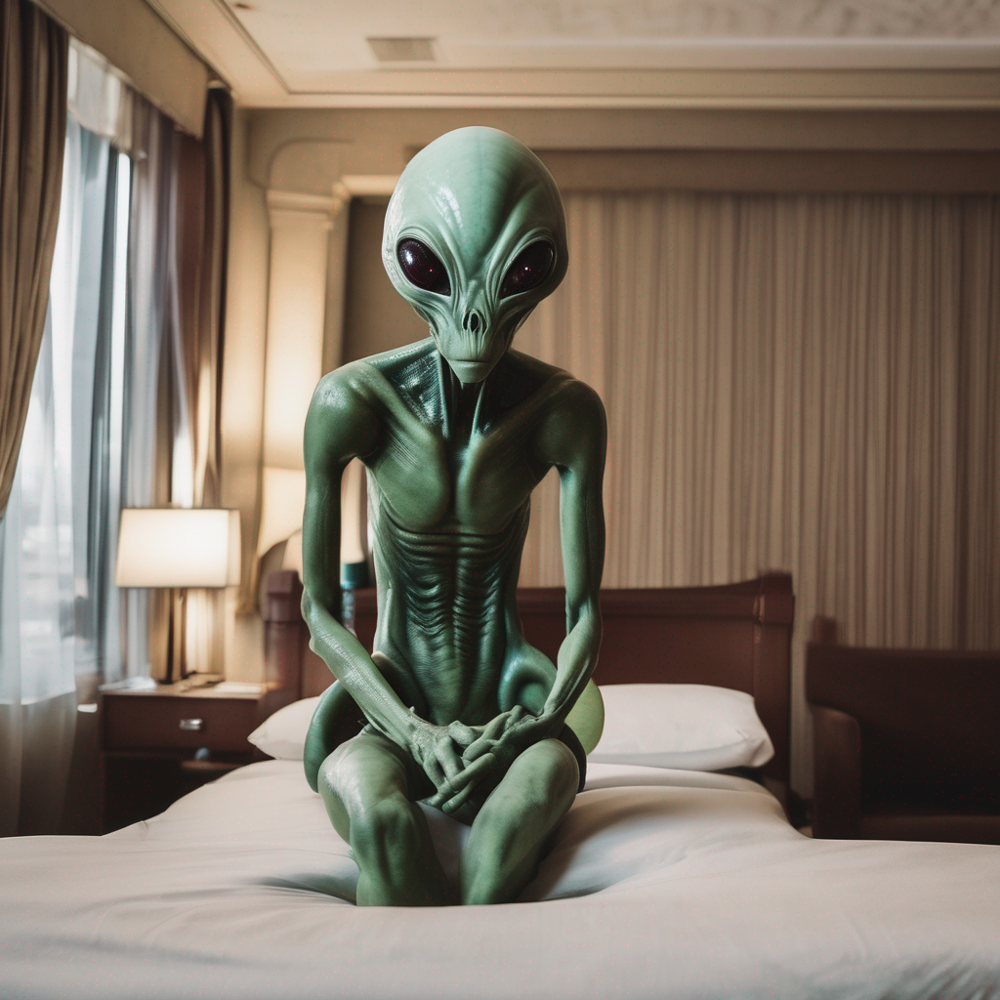

In [ ]:
images

### **Обогащение датасета описаниями**

#### Получаем датасет. Занимает продолжительное время (минут 5)

В данных ячейках происходит парсинг датасета, а вернее фотографий, которые доступны по указанным в датасете ссылкам

In [1]:
!mkdir hotels-50k
!wget -P hotels-50k https://github.com/GWUvision/Hotels-50K/raw/master/input/dataset.tar.gz
!tar -xvzf hotels-50k/dataset.tar.gz -C hotels-50k
!rm hotels-50k/dataset.tar.gz

--2023-09-07 10:33:08--  https://github.com/GWUvision/Hotels-50K/raw/master/input/dataset.tar.gz
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/GWUvision/Hotels-50K/master/input/dataset.tar.gz [following]
--2023-09-07 10:33:08--  https://raw.githubusercontent.com/GWUvision/Hotels-50K/master/input/dataset.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14353865 (14M) [application/octet-stream]
Saving to: ‘hotels-50k/dataset.tar.gz’

dataset.tar.gz      100%[===================>]  13.69M  --.-KB/s    in 0.1s    

2023-09-07 10:33:11 (109 MB/s) - ‘hotels-50k/dataset.tar.gz’ saved [14353865/

In [2]:
import pandas as pd
import tqdm
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib import pyplot as plt

In [3]:
chain_df = pd.read_csv("./hotels-50k/dataset/chain_info.csv")
display(chain_df.head())
hotel_df = pd.read_csv("./hotels-50k/dataset/hotel_info.csv")
display(hotel_df.head())
train_df = pd.read_csv('./hotels-50k/dataset/train_set.csv', header=None,
                       names=['image_id', 'hotel_id', 'url', 'source', 'timestamp'])

display(train_df.head())
data_df = train_df.merge(hotel_df, on="hotel_id").merge(chain_df, on="chain_id")
data_df["image_id"] = data_df["image_id"].astype(str)
data_df["hotel_id"] = data_df["hotel_id"].astype(str)
data_df["chain_id"] = data_df["chain_id"].astype(str)

display(data_df.head())

print("Image count:", len(data_df))
print("Hotel count:", len(data_df["hotel_id"].unique()))
print("Chain count:", len(data_df["chain_id"].unique()))

chain_group_df = data_df.groupby(["chain_name"]).agg({"hotel_id": [pd.Series.nunique], "image_id" : [pd.Series.nunique]})
chain_group_df.columns = ["_".join(x) for x in chain_group_df.columns.ravel()]
chain_group_df = chain_group_df.reset_index().sort_values("hotel_id_nunique")[::-1]

hotel_group_df = data_df.groupby(by=["hotel_id"])["image_id"].count().to_frame("image_count")


,chain_id,chain_name
0,-1,unknown
1,0,Best Western
2,1,Hyatt
3,2,Marriott
4,3,Hilton


,hotel_id,hotel_name,chain_id,latitude,longitude
0,391,Extended Stay America - Fairbanks - Old Airpor...,72,64.83538,-147.82330
1,392,Hilton Hangzhou Qiandao Lake Resort,3,29.60819,119.07290
2,393,Taj Lands End,-1,19.04391,72.81879
3,395,Cambridge Suites Hotel Sydney,-1,46.13663,-60.19551
4,396,Tamanu Beach,14,-18.84213,-159.78794


,image_id,hotel_id,url,source,timestamp
0,3485,18187,https://traffickcam.com/images/2016/10/2015090...,traffickcam,9/9/15 17:23
1,3486,18187,https://traffickcam.com/images/2016/10/2015090...,traffickcam,9/9/15 17:23
2,3663,73224,https://traffickcam.com/images/2016/10/2015091...,traffickcam,9/17/15 19:33
3,2586939,86350,https://traffickcam.com/images/2017/2/20160125...,traffickcam,1/25/16 19:12
4,2586950,1533,https://traffickcam.com/images/2017/2/20160125...,traffickcam,1/25/16 17:23


,image_id,hotel_id,url,source,timestamp,hotel_name,chain_id,latitude,longitude,chain_name
0,3485,18187,https://traffickcam.com/images/2016/10/2015090...,traffickcam,9/9/15 17:23,Hilton Minneapolis,3,44.97338,-93.27331,Hilton
1,3486,18187,https://traffickcam.com/images/2016/10/2015090...,traffickcam,9/9/15 17:23,Hilton Minneapolis,3,44.97338,-93.27331,Hilton
2,2599229,18187,https://traffickcam.com/images/2017/7/20160627...,traffickcam,6/27/16 21:27,Hilton Minneapolis,3,44.97338,-93.27331,Hilton
3,2599231,18187,https://traffickcam.com/images/2017/7/20160627...,traffickcam,6/27/16 21:27,Hilton Minneapolis,3,44.97338,-93.27331,Hilton
4,2599232,18187,https://traffickcam.com/images/2017/7/20160627...,traffickcam,6/27/16 21:27,Hilton Minneapolis,3,44.97338,-93.27331,Hilton


Image count: 1124215
Hotel count: 50000
Chain count: 93


<ipython-input-3-fb9fe9ab26d8>:21: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  chain_group_df.columns = ["_".join(x) for x in chain_group_df.columns.ravel()]


In [4]:
sample_hotels = hotel_group_df[(hotel_group_df["image_count"] > 10) & (hotel_group_df["image_count"] < 100)]
print("Number of hotels with more than 10 images and less than 100:", len(sample_hotels))
sample_hotels = sample_hotels.sample(50, random_state=42)
sample_df = data_df[data_df["hotel_id"].isin(sample_hotels.index)].reset_index(drop=True)
print("Sampled images:", len(sample_df))

Number of hotels with more than 10 images and less than 100: 42629
Sampled images: 1218


In [5]:
from __future__ import print_function
import csv, multiprocessing, cv2, os
import numpy as np
import urllib
import urllib.request
import warnings
warnings.filterwarnings('ignore')
import ssl

ctx = ssl.create_default_context()
ctx.check_hostname = False
ctx.verify_mode = ssl.CERT_NONE

output_folder = "hotels-50k/images"
output_image_folder  = output_folder + "/train"

os.makedirs(output_image_folder)

def url_to_image(url):
    resp = urllib.request.urlopen(url, context=ctx)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_UNCHANGED)
    return image


def download_images(imList):
    # 2d list, rows are samples
    # columns: "chain_id", "hotel_id", "source", "image_id", "url"
    for im in imList:
        try:
            saveDir = os.path.join(output_image_folder, im[0], im[1], im[2])
            if not os.path.exists(saveDir):
                os.makedirs(saveDir)

            savePath = os.path.join(saveDir, str(im[3])+'.'+im[4].split('.')[-1])

            if not os.path.isfile(savePath):
                img = url_to_image(im[4])
                cv2.imwrite(savePath,img)
            else:
                print('Already exists: ' + savePath)
        except Exception as e:
            print(e, ': ' + im[4])

In [6]:
%%time

image_data_array = sample_df[["chain_id", "hotel_id", "source", "image_id", "url"]].values

pool = multiprocessing.Pool()
NUM_THREADS = multiprocessing.cpu_count()
for cpu in range(NUM_THREADS):
    pool.apply_async(download_images,[image_data_array[cpu::NUM_THREADS]])

pool.close()
pool.join()

HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/c352433e_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/ef7f7c69_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/19208845_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/a3611487_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/50957b30_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/93e4ffae_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/629493e2_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/f134d7ba_b.jpg
HTTP Error 404: Not Found : https://i.travelapi.com/hotels/2000000/1600000/1593900/1593828/ec67a485_b.jpg
HTTP Error 404: Not Found : https://i.travelap

In [7]:
!find {output_image_folder} -type f | wc -l

866


In [8]:
# update the sample data frame with path, image name and whether it was downloaded
sample_df["downloaded"] = False
sample_df["image_name"] = None
sample_df["image_folder"] = None

for index, row in sample_df.iterrows():
    image_folder = os.path.join(output_image_folder, row["chain_id"], row["hotel_id"], row["source"])
    image_name   = row["image_id"] + '.'+ row["url"].split('.')[-1]
    image_path   = os.path.join(image_folder, image_name)
    if os.path.exists(image_path):
        sample_df.loc[index, "downloaded"] = True
        sample_df.loc[index, "image_name"] = image_name
        sample_df.loc[index, "image_folder"] = image_folder

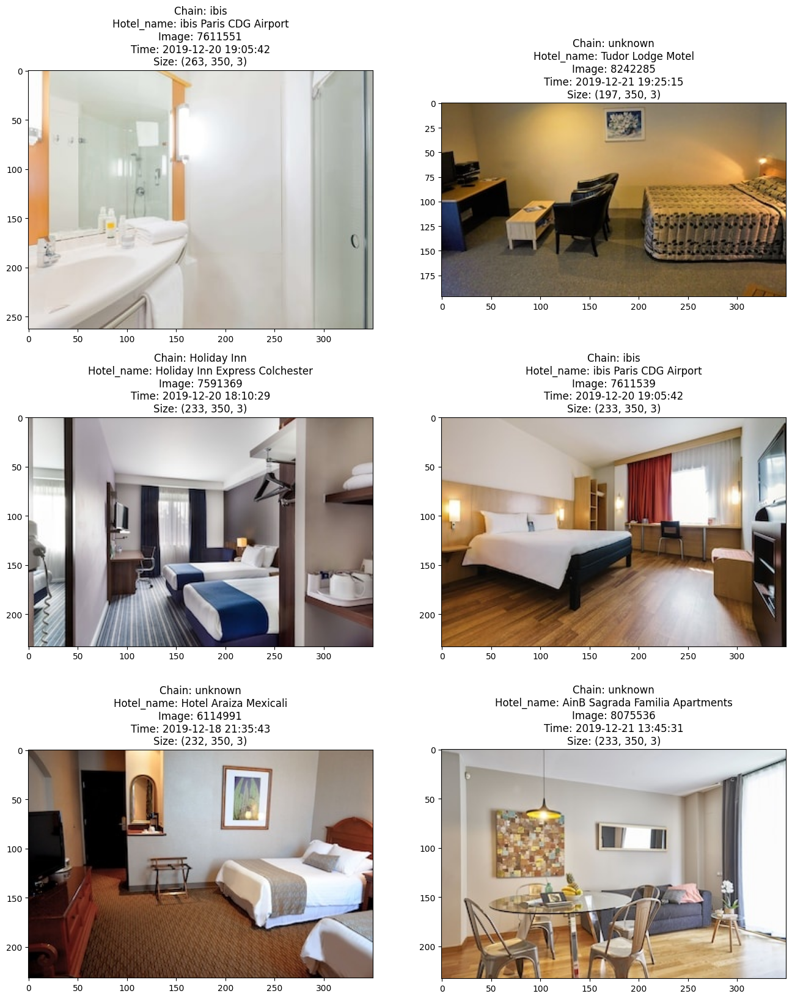

In [9]:
downloaded_df = sample_df[sample_df["downloaded"]].sample(6, random_state=42)

fig, axes = plt.subplots(3,2, figsize=(16,20))
axes = axes.ravel()

for i in range(6):
    sample = downloaded_df.iloc[i]
    img = cv2.imread(os.path.join(sample["image_folder"], sample["image_name"]))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(f"Chain: {sample.chain_name}\n" +
                     f"Hotel_name: {sample.hotel_name}\n"
                     f"Image: {sample.image_id}\n" +
                     f"Time: {sample.timestamp}\n" +
                     f"Size: {np.shape(img)}")

In [10]:
# number of downloaded images should be the same as number of images in the output_image_folder
print("Number of downloaded images:", sample_df["downloaded"].sum())

Number of downloaded images: 866


#### Составляем датасет и делаем предобработку

In [11]:
import os
import shutil
from os import listdir
from os.path import join, isfile


src_folder = "/content/hotels-50k/images/train"
dst_folder = "/content/train_aug"

if not os.path.exists(dst_folder):
    os.makedirs(dst_folder)

for dirpath, dirs, files in os.walk(src_folder):
  for file in files:
    if file.endswith(".jpg"): # предполагая, что все изображения в формате jpg
      src_path = os.path.join(dirpath, file)
      dst_path = os.path.join(dst_folder, file)
      shutil.move(src_path, dst_path)

#### Используем CLIP, чтобы получить тэги

In [12]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 47.1 MB/s eta 0:00:00


In [13]:
from PIL import Image
import requests

from transformers import CLIPProcessor, CLIPModel

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

In [14]:
folder_name = '/content/train_aug'
filenames = [folder_name+'/'+f for f in listdir(folder_name) if isfile(join(folder_name, f))]

In [15]:
hotel_tags = ['big window','small bed','big bed', 'lamp', 'TV', 'painting', 'table', 'Beach', 'sky view',  'Pool', 'Garden', 'Terrace', 'Balcony',
        'Restaurant', 'Bar', 'Gym', 'Spa', 'Lobby', 'Bathroom', 'Kitchen',
        'Reception', 'Sunset', 'Night view',   'Parking', 'Safe', 'Coffee' ]

In [16]:
df_with_tags = pd.DataFrame(columns=['filename', 'tag'])

Будем выводить каждое 30 фото и его тэг, чтобы не засорять вывод.

Bathroom


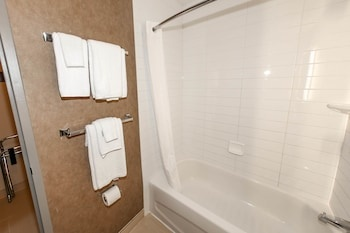

big bed


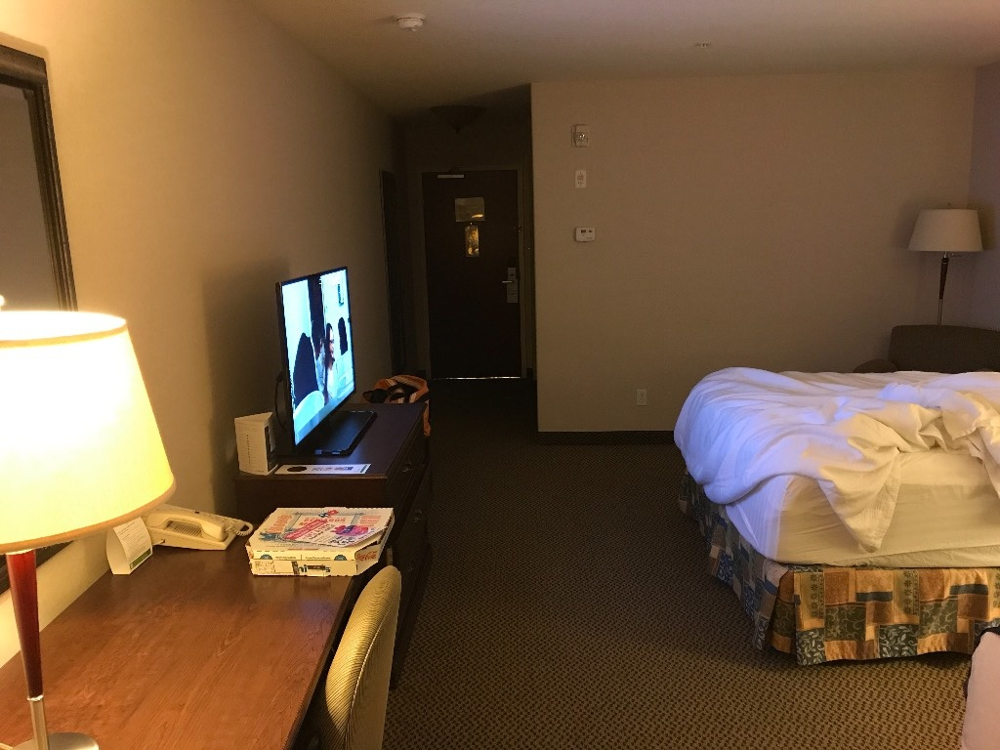

small bed


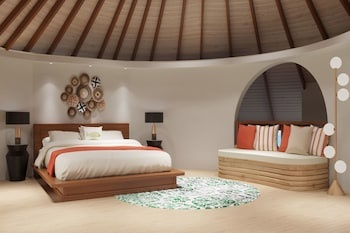

Lobby


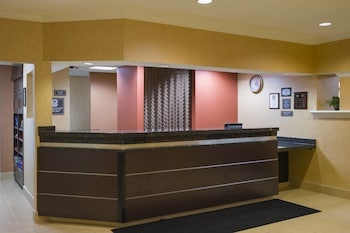

big bed


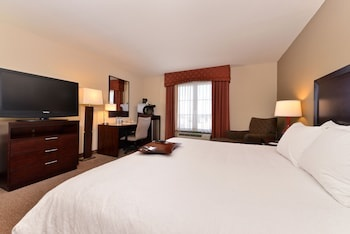

small bed


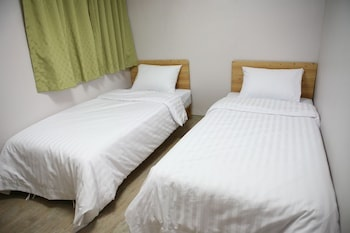

big bed


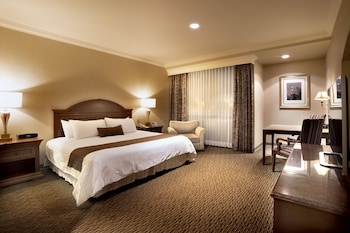

Lobby


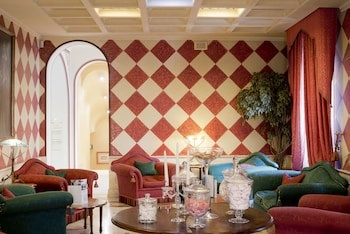

Lobby


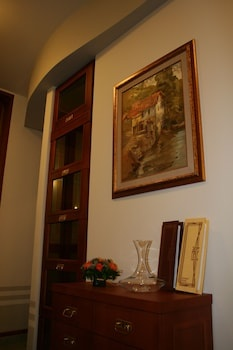

Lobby


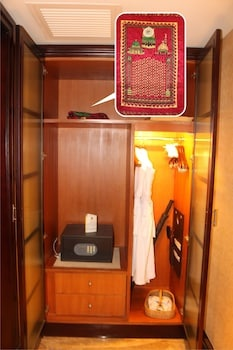

big bed


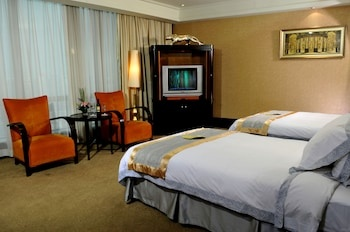

Bathroom


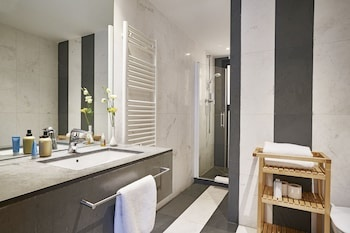

big bed


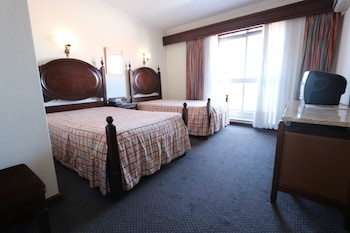

small bed


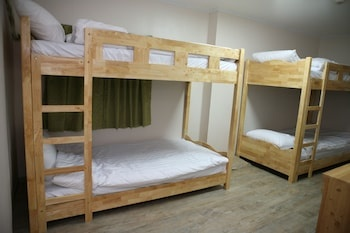

Lobby


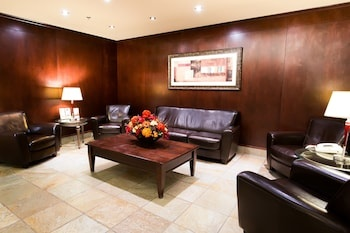

Reception


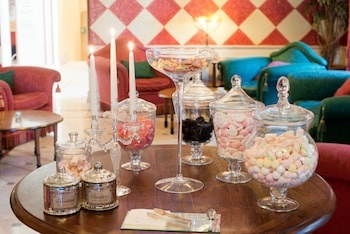

Bathroom


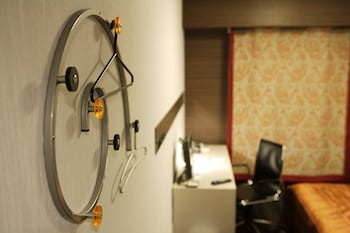

small bed


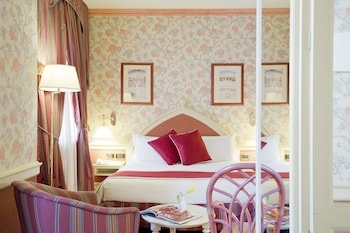

Bathroom


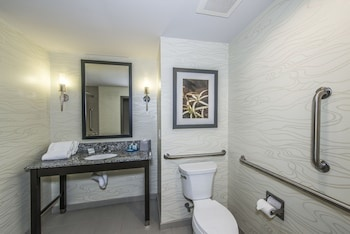

Kitchen


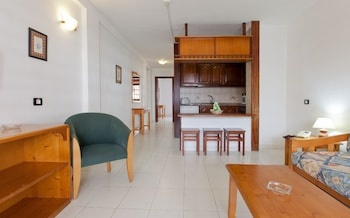

Bathroom


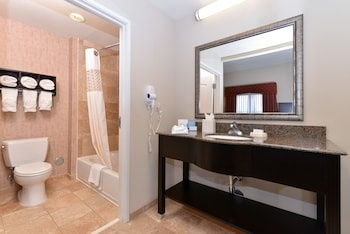

Bathroom


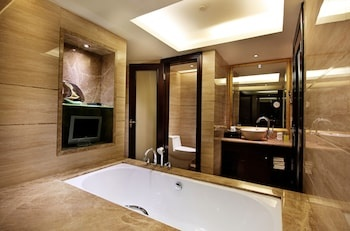

Spa


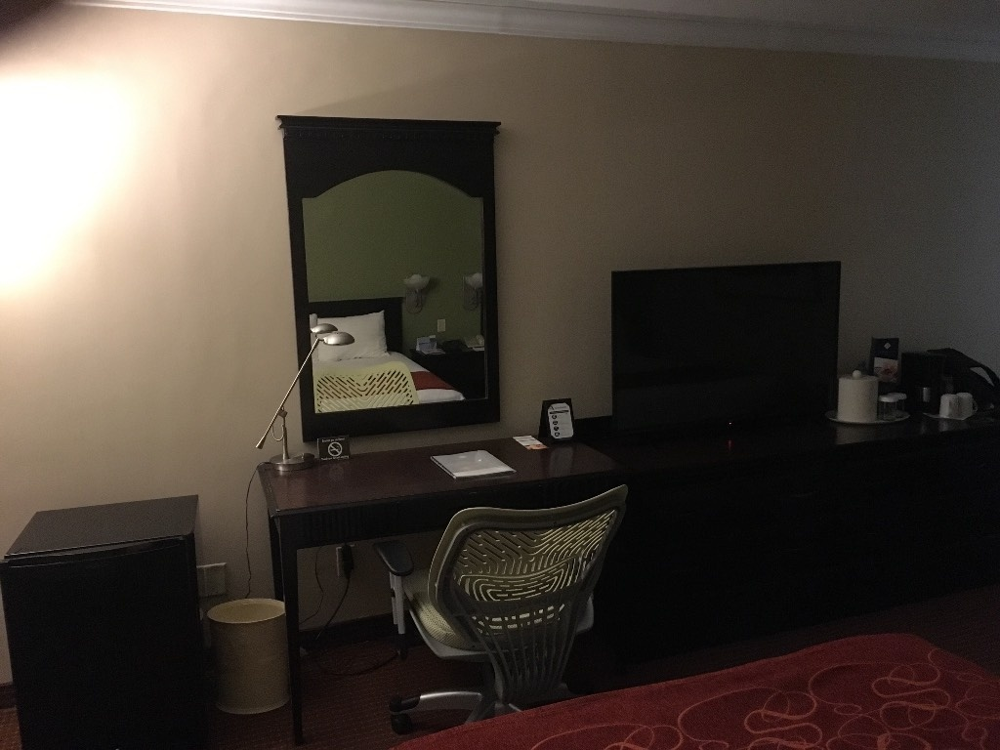

big bed


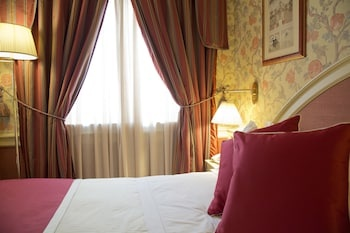

small bed


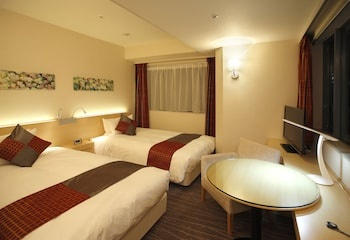

table


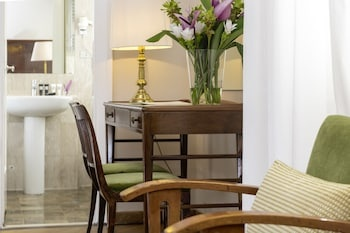

small bed


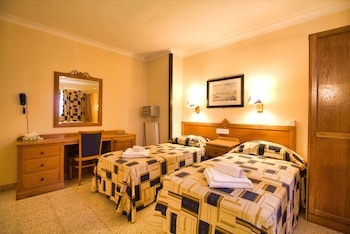

small bed


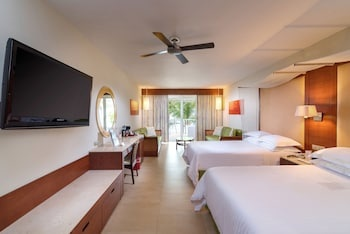

In [17]:
from IPython.display import display

i = 0
for filename in filenames:
  i+=1
  image = Image.open(filename)
  inputs = processor(text=hotel_tags, images=image, return_tensors="pt", padding=True)
  outputs = model(**inputs)
  logits_per_image = outputs.logits_per_image  # this is the image-text similarity score
  probs = logits_per_image.softmax(dim=1)

  if i%30==0:
    print(hotel_tags[probs.argmax()])
    display(image)

  df_with_tags = df_with_tags.append({'filename':filename, 'tag':hotel_tags[probs.argmax()]}, ignore_index=True)

In [18]:
df_with_tags

,filename,tag
0,/content/train_aug/6028476.jpg,Bathroom
1,/content/train_aug/6696971.jpg,small bed
2,/content/train_aug/6886221.jpg,Lobby
3,/content/train_aug/7591365.jpg,small bed
4,/content/train_aug/7591366.jpg,big bed
...,...,...
849,/content/train_aug/7023811.jpg,TV
850,/content/train_aug/7708340.jpg,small bed
851,/content/train_aug/8242284.jpg,big bed
852,/content/train_aug/7066645.jpg,Bathroom


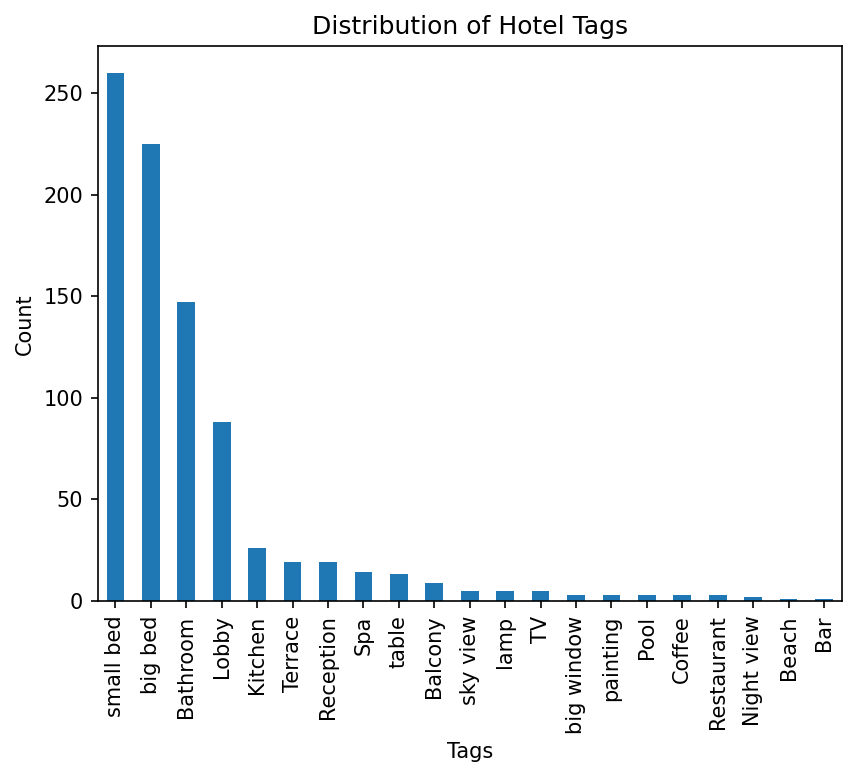

In [ ]:
plt.figure(dpi=150)
df_with_tags['tag'].value_counts().plot(kind='bar')
plt.xlabel('Tags')
plt.ylabel('Count')
plt.title('Distribution of Hotel Tags')
plt.show()

### Сделаем кластеризацию по тегам с помощью resnet50

In [19]:
import torch
import torchvision.models as models
from torchvision import transforms
from PIL import Image
from sklearn.cluster import KMeans

# Загрузка предобученной модели ResNet
model = models.resnet50(pretrained=True)
model.eval()

# Предварительная обработка изображения
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Функция для получения эмбеддинга из изображения
def get_embedding(image_path):
    image = preprocess(Image.open(image_path))
    image = torch.unsqueeze(image, 0)
    with torch.no_grad():
        embedding = model(image)
    return embedding.squeeze().numpy()

# Папка с фотографиями
photo_folder = "train_aug/"

# Список эмбеддингов всех фотографий
embeddings = []

# Получение эмбеддингов для всех фотографий в папке
for photo_file in os.listdir(photo_folder):
    photo_path = os.path.join(photo_folder, photo_file)
    embedding = get_embedding(photo_path)
    embeddings.append(embedding)

# Кластеризация эмбеддингов
kmeans = KMeans(n_clusters=27)
cluster_labels = kmeans.fit_predict(embeddings)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 134MB/s]


Построим гистрограмму распределения по класстерам

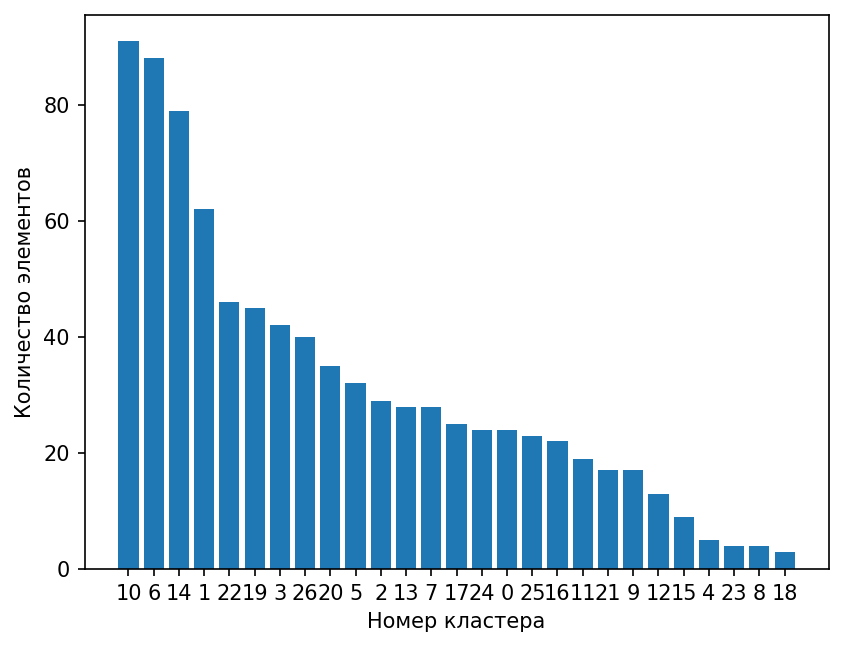

In [63]:
cluster_counts = {}
for label in cluster_labels:
    if label in cluster_counts:
        cluster_counts[label] += 1
    else:
        cluster_counts[label] = 1

cluster_counts = dict(sorted(cluster_counts.items(), key=lambda item: item[1],reverse=True))
# Получим уникальные номера кластеров и их соответствующие количества
cluster_counts = {str(key): value for key, value in cluster_counts.items()}

plt.figure(dpi=150)
# Получим уникальные номера кластеров и их соответствующие количества
clusters = list(cluster_counts.keys())
counts = list(cluster_counts.values())

# Построим гистограмму
plt.bar(clusters, counts)

# Добавим подписи на оси x и y
plt.xlabel('Номер кластера')
plt.ylabel('Количество элементов')

# Покажем гистограмму
plt.show()

Выведем только фото, относящиеся к 5 класстеру, чтобы не засорять вывод.

6678368.jpg: 0


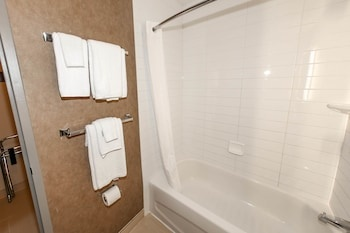

7446523.jpg: 0


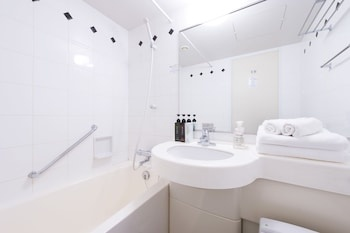

7591378.jpg: 0


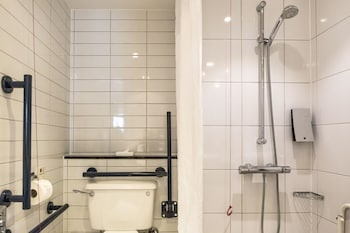

6498531.jpg: 0


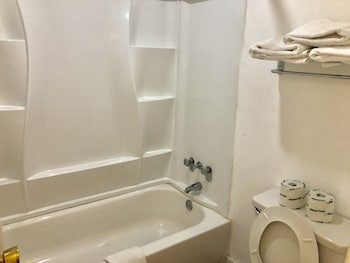

8124840.jpg: 0


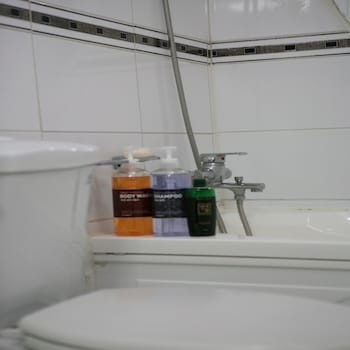

6678366.jpg: 0


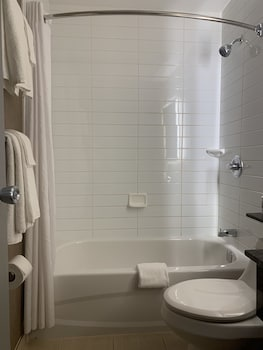

7456211.jpg: 0


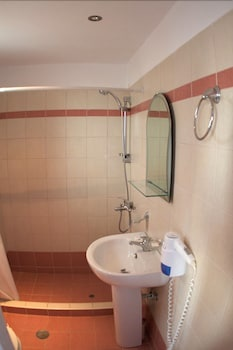

8124838.jpg: 0


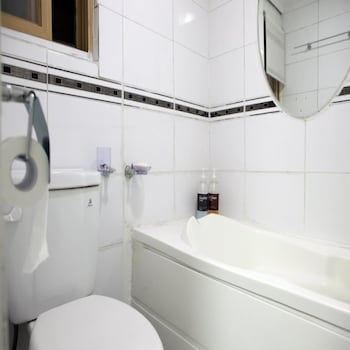

7150911.jpg: 0


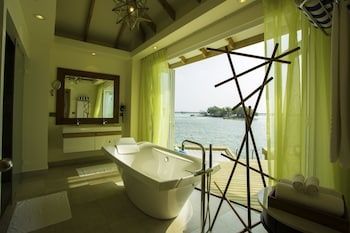

8124839.jpg: 0


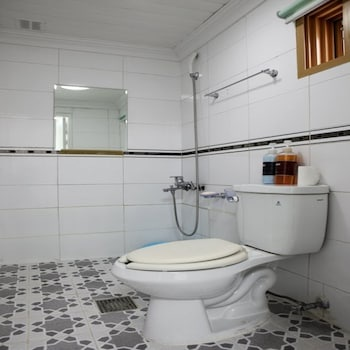

7591379.jpg: 0


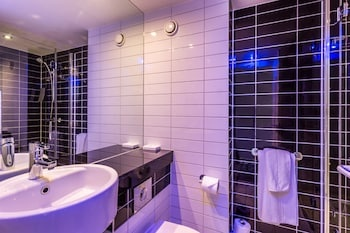

6366355.jpg: 0


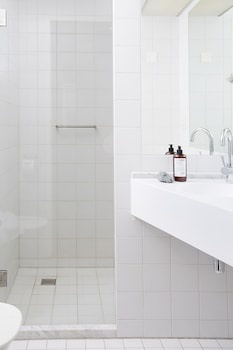

6696975.jpg: 0


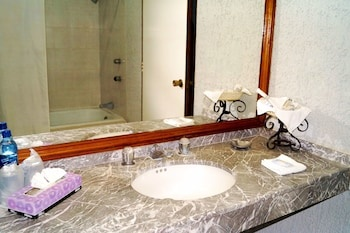

8124836.jpg: 0


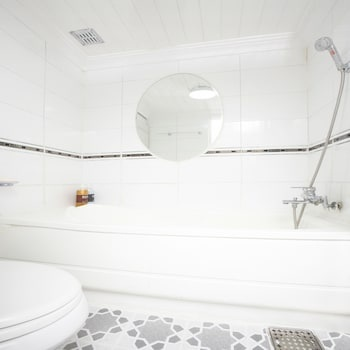

6498532.jpg: 0


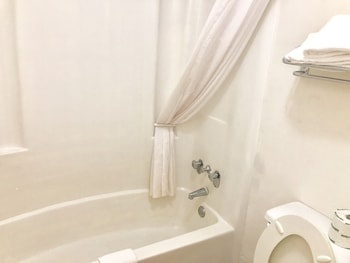

6883111.jpg: 0


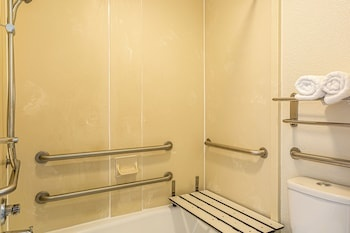

6886161.jpg: 0


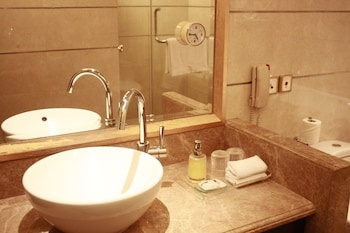

6042423.jpg: 0


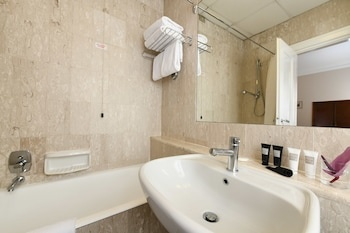

6886230.jpg: 0


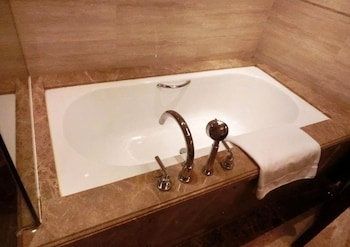

6678365.jpg: 0


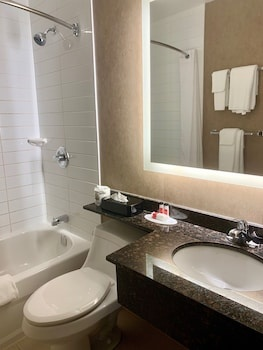

7708352.jpg: 0


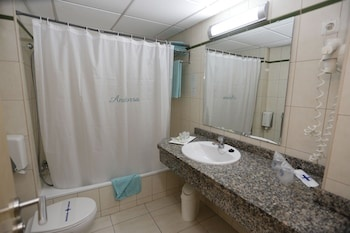

7591377.jpg: 0


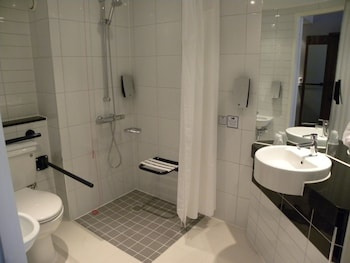

9484583.jpg: 0


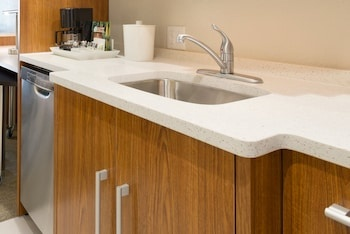

6678367.jpg: 0


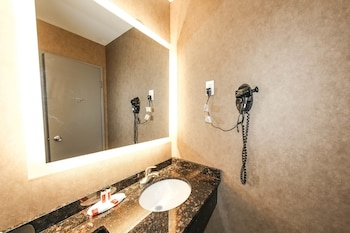

In [65]:
# Например, выведем номер кластера для каждой фотографии
for photo_file, cluster_label in zip(os.listdir(photo_folder), cluster_labels):
    if cluster_label==0:
      print(f"{photo_file}: {cluster_label}")
      image = Image.open(photo_folder+photo_file)
      display(image)


### Изменение изображения при помощи диффузионной модели

In [ ]:
!pip install diffusers accelerate safetensors transformers

In [ ]:
import PIL
from PIL import Image
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe.to("cuda")
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)



Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
image = Image.open("/content/train_aug/7446509.jpg")
prompt = "add tulip on the bed"

  0%|          | 0/10 [00:00<?, ?it/s]

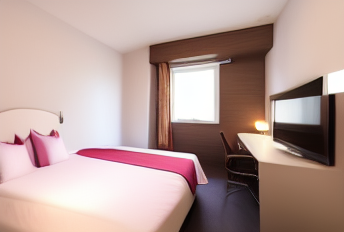

In [ ]:
images = pipe(prompt, image=image, num_inference_steps=10, image_guidance_scale=1).images
images[0]